# Import the Normalized Database

In [1]:
import numpy as np 
db = np.load('db1_5SS_norm_s8688.npz')
print(db['pathData'].shape)
print(db['orientData'].shape)
print(db['mechData'].shape)
cplrpath=db['pathData']
cplrorient=db['orientData']
mech=db['mechData']
orig_index=db['origindex']

(8688, 25, 3)
(8688, 25, 4)
(8688, 11, 3)


In [13]:
%run "plotting_functions.ipynb"

# Data balancing using undersampling: remove similar paths to enhance variety

In its present state, the database has more samples of coupler paths which are more probable while lesser samples of other more diverse. However, we would like our NN to handle all types of coupler paths with same efficiency and accuracy. To overcome this bias, we select a limited number of diverse paths from the complete database. Thus, this new balanced dataset contains equal samples of unique and diverse paths.

## Basic P2 Norm(NOT USED)

We use P2 norm of difference between two curves as the metric to compare the similarity between two curves. This metric cannot detect same curves which have undergone transformation like translation, rotation or scaling. However, since we have already done that in the preprocessing, it works as a good metric. To check for parametrization in inverse direction, we also check the flipped paths to compare P2 norm. Unfortunately, partial matching is not possible with this metric.

In [3]:
def compareEqualCurve(path1, path2):
    delta1=LA.norm(path1-path2)/len(path1)
    #return delta1
    delta2=LA.norm(path1-np.fliplr(path2))/len(path1) #for inverse time parametrization
    return np.array([delta1,delta2]).min()
    

def findDiverseP2norm(pathdb, threshold):
    DiverseCplr=np.array([pathdb[0]])
    for i in range(1,len(pathdb)):
        if i%500==0:
            print("Paths Processed:"+ str(i)+" ,unique Paths in DB:"+str(DiverseCplr.shape[0]))
        
        path1=pathdb[i]
        diff=np.array([])
        for path2 in DiverseCplr:
            diff=np.append(diff,[compareEqualCurve(path1, path2)])
        
        if diff.min()>threshold:
            DiverseCplr=np.append(DiverseCplr,[path1], axis=0)
    
    print("Database size before removing similar paths: " + str(cplr.shape[0]))
    print("Database size after removing similar paths: " + str(DiverseCplr.shape[0]))
    return DiverseCplr

In [4]:
#DiverseCplr=findDiverseP2norm(cplr, .001)

In [5]:
#visualizePaths(DiverseCplr)

<IPython.core.display.Javascript object>


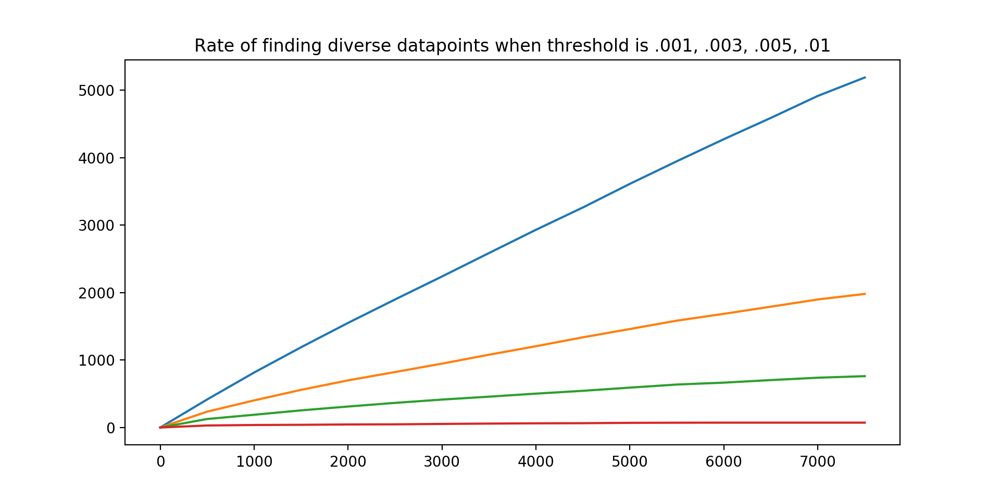

Text(0.5, 1.0, 'Rate of finding diverse datapoints when threshold is .001, .003, .005, .01')

In [6]:
# Rate at which diverse data is added
# Ideally, to represent all of the curves, data should be added until the plot saturates
x=range(0,8000,500)
y_001=[0,416,815,1190,1551,1898,2239,2586,2931,3262,3612,3947,4274,4589,4915,5188]
y_003=[0,235,402,558,699,822,947,1079,1205,1337,1460,1584,1685,1791,1898,1980]
y_005=[0,126,189,254,311,365,414,457,502,544,591,637,665,703,738,761]
y_01=[0,30,37,40,45,47,53,58,62,64,69,71,72,72,72,72]
fig = plt.figure(figsize=plt.figaspect(1/2))
ax = fig.add_subplot(111)
ax.plot(x,y_001)
ax.plot(x,y_003)
ax.plot(x,y_005)
ax.plot(x,y_01)
ax.set_title("Rate of finding diverse datapoints when threshold is .001, .003, .005, .01")

## Frenet frame descriptors (P2 norm of Curvature and Torsion)

Curvature and Torsion References: 
- Shape Curve Analysis Using Curvature by James Miller (PhD, University of Glasgow)[link](http://theses.gla.ac.uk/854/1/2009millerphd.pdf)
- Wiki Frenet–Serret formulas [link](https://en.wikipedia.org/wiki/Frenet%E2%80%93Serret_formulas#Other_expressions_of_the_frame)

According to the "fundamental theorem of space curves" in differential geometry, every regular curve in three-dimensional space, with non-zero curvature, has its shape (and size) completely determined by its curvature and torsion. Thus, a better metric to compare the similarity of two curves are these Frenet–Serret Descriptors. The curvature is always positive while the torsion can be negative.

These descriptors are invariant to spatial translation and rotation. However, they are not scaling invariant. If the curve is scaled uniformly $\alpha$ times, the curvature and torsion scales $\frac{1}{\alpha}$ times. Thus, matching at same scale is possible. Also, the Frenet–Serret descritors can be successfully used to compare two curves of unequal length and match them when one is a part of another. This approach is thus better than the P2 norm comparision.

Intrestingly, the intregral of curvature are scaling invariant in addition to translation and rotation and thus could be used for partial curve comparision. Also, numerical calculation of torsion can end up being extremely inaccurate. Thus, we weigh curvature heavily in our metric used to filter out similar paths

In [7]:
# Find a b-spline curve with its differentials
from scipy import interpolate
def calcCurveProp(path):
    n=np.array(path).shape[0]
    xp=path[:,0]
    yp=path[:,1]
    zp=path[:,2]
    u_fine = np.linspace(0,1,n)
    tck, u =interpolate.splprep([xp,yp,zp],s=.001,k=4)
    x, y, z = interpolate.splev(u_fine, tck)
    Path= np.vstack(([x],[y],[z])).T
    x_d, y_d, z_d = interpolate.splev(u_fine, tck, der=1)
    Path_d= np.vstack(([x_d],[y_d],[z_d])).T
    x_dd, y_dd, z_dd = interpolate.splev(u_fine, tck, der=2)
    Path_dd= np.vstack(([x_dd],[y_dd],[z_dd])).T
    x_ddd, y_ddd, z_ddd = interpolate.splev(u_fine, tck, der=3)
    Path_ddd= np.vstack(([x_ddd],[y_ddd],[z_ddd])).T
    return Path, Path_d, Path_dd, Path_ddd

def calcFrenetFrame(path):
    Path, Path_d, Path_dd, Path_ddd= calcCurveProp(path)
    T,N,B=[],[],[]
    for i in range(len(path)):
        T.append(Path_d[i]/np.linalg.norm(Path_d[i]))
        num=np.cross(Path_d[i],np.cross(Path_dd[i],Path_d[i]))
        den=np.linalg.norm(Path_d[i])*np.linalg.norm(np.cross(Path_dd[i],Path_d[i]))
        N.append(num/den)
        B.append(np.cross(T[i],N[i]))
    return np.array(T), np.array(N), np.array(B)

def calcCurvatureTorsion(path):
    Path, Path_d, Path_dd, Path_ddd= calcCurveProp(path)
    K,T=[],[]
    n=np.array(path).shape[0]
    for i in range(n):
        vec=np.cross(Path_d[i],Path_dd[i])
        curv=np.linalg.norm(vec)/(np.linalg.norm(Path_d[i])**3)
        tors=np.dot(vec,Path_ddd[i])/(np.linalg.norm(vec)**2)
        K.append(curv)
        T.append(tors)
    return K,T

# Plot a curve and its Curvature,Torsion
def plotFrenetDesc(path,Curvature,Torsion):
    fig = plt.figure(figsize=.9*plt.figaspect(1/2))
    ax = fig.add_subplot(1, 2, 1, projection='3d')
    plotPath(path, ax, .5)

    ax = fig.add_subplot(1, 2, 2)
    n=np.array(Curvature).shape[0]
    ax.plot(range(n), Curvature, label='Curvature');
    ax.plot(range(n), Torsion, label='Torsion');
    plt.grid(True)
    #plt.ylim(0, 10);
    plt.legend()
    plt.tight_layout()
    plt.show()

def calcDB_CurvTor(cplr):
    K=[] #Curvature
    T=[] #Torsion
    for i in range(len(cplr)):
        Ki,Ti=calcCurvatureTorsion(cplr[i])
        K.append(Ki)
        T.append(Ti)
    return K,T

def calcDB_minmaxCurvTor(K,T):
    maxK=[]
    minK=[]
    maxT=[]
    minT=[]
    for i in range(len(K)):
        maxK.append(np.max(K[i]))
        minK.append(np.min(K[i]))
        maxT.append(np.max(T[i]))
        minT.append(np.min(T[i]))
    print("Max Curvature: "+ str(np.max(maxK)) +" , Index: " +str(np.argmax(maxK)))
    print("Min Curvature: "+ str(np.min(minK)) +" , Index: " +str(np.argmin(minK)))
    print("Max Torsion: "+ str(np.max(maxT)) +" , Index: " +str(np.argmax(maxT)))
    print("Min Torsion: "+ str(np.min(minT)) +" , Index: " +str(np.argmin(minT)))
    return maxK,minK,maxT,minT

In [8]:
# Find the Curvature and Torsion for DB
K,T=calcDB_CurvTor(cplrpath)
print(np.array(K).shape)
print(np.array(T).shape)

(8688, 25)
(8688, 25)


Max Curvature: 5774.950932904686 , Index: 5182
Min Curvature: 0.004794738930154485 , Index: 4402
Max Torsion: 2680.0889404628238 , Index: 3515
Min Torsion: -991.7925217752514 , Index: 4696


<IPython.core.display.Javascript object>


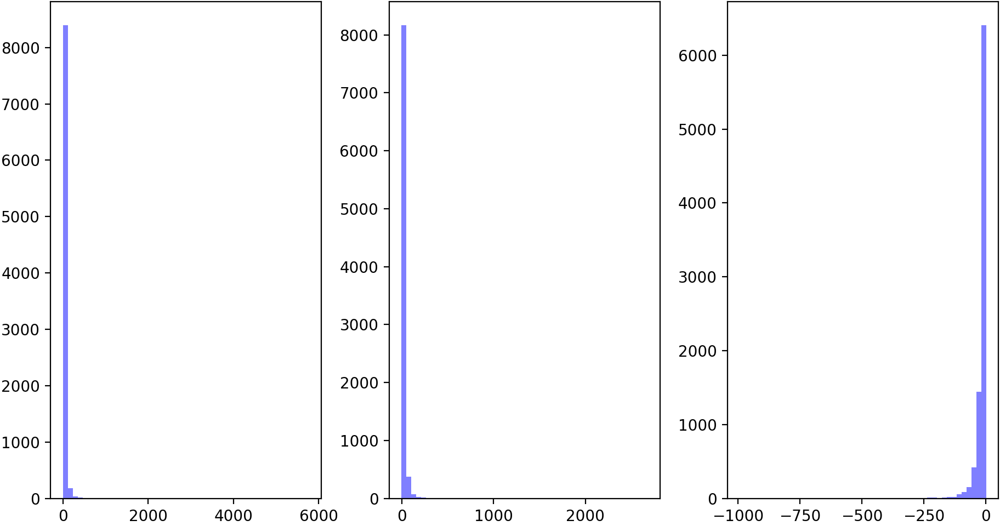

[8395  182   40   19   11    7    8    3    9    3    0    1    1    0
    2    1    0    0    0    0    1    0    0    0    1    0    0    0
    1    0    0    0    0    0    0    1    0    0    0    1    0    0
    0    0    0    0    0    0    0    1]
[8167  378   75   28   16    7    5    0    2    3    1    1    0    0
    1    0    0    0    0    0    1    0    0    0    0    0    0    0
    0    1    0    0    0    0    0    0    0    1    0    0    0    0
    0    0    0    0    0    0    0    1]
[   1    0    0    1    0    0    0    0    1    0    0    0    0    0
    0    0    0    0    0    0    0    1    0    1    1    0    1    2
    1    3    0    2    3    3    1    1    5    7   10   13    8   13
   24   21   54   91  152  418 1443 6406]


In [9]:
def visualizeCurTorHist(maxK, maxT, minT):
    # Visualize Curvature
    fig = plt.figure(figsize=1*plt.figaspect(1/1.9))
    ax = fig.add_subplot(1, 3, 1)
    n, bins, patches = ax.hist(maxK, 50, facecolor='blue', alpha=0.5)
    print(np.array(n, dtype='int'))

    # Visualize Torsion
    ax = fig.add_subplot(1, 3, 2)
    n, bins, patches = ax.hist(maxT, 50, facecolor='blue', alpha=0.5)
    print(np.array(n, dtype='int'))

    ax = fig.add_subplot(1, 3, 3)
    n, bins, patches = ax.hist(minT, 50, facecolor='blue', alpha=0.5)
    plt.show()
    print(np.array(n, dtype='int'))
    plt.tight_layout(pad=.1)

# Analyze min-max
maxK,minK,maxT,minT=calcDB_minmaxCurvTor(K,T)
visualizeCurTorHist(maxK, maxT, minT)

4


<IPython.core.display.Javascript object>


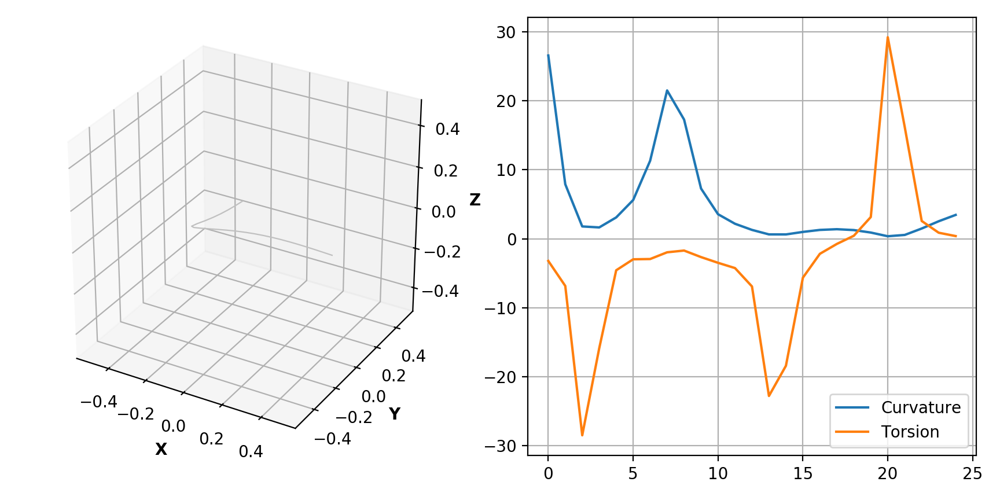

<IPython.core.display.Javascript object>


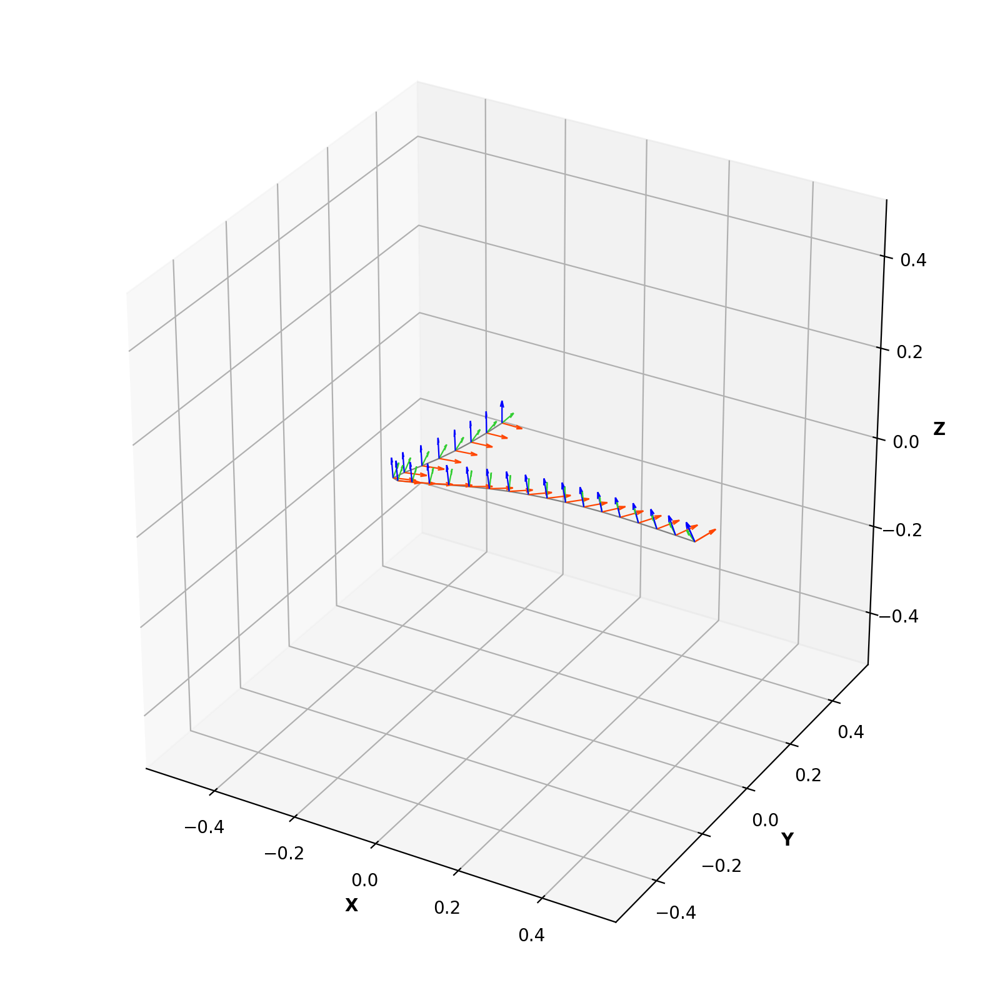

array([[ 0.27120669, -1.48474113, -0.90823559],
       [-0.13258619, -2.38437419, -0.69025173],
       [ 0.57826099, -1.6550271 ,  1.473452  ],
       [ 0.39661896, -0.03254518, -2.4749542 ],
       [-3.52567762, -1.04154622, -1.00537638],
       [ 0.64840786, -4.55027989, -2.5684022 ],
       [ 0.18320137, -1.66912749, -2.90141709],
       [-0.08317736, -0.16556603, -0.46143572],
       [-0.89629369, -3.86595149, -0.26434868],
       [ 1.05730622, -1.61167533,  0.39383085],
       [-0.0768508 , -0.06529503,  0.01151038]])

In [14]:
# Plot Coupler curve and its Descriptors
index=4
print(orig_index[index])
Pts=cplrpath[index]
Orient=cplrorient[index]
Ki=K[index]
Ti=T[index]
plotFrenetDesc(Pts,Ki,Ti)

fig= plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection='3d')
plotMotion(Pts,Orient, ax,limit=.5)

# Check simulation in Matlab
mech[index]

In [15]:
def compareCurvTorMetric(K1, K2, T1, T2):
    # We compute weighted sum of p-2 norms of difference in Curvature and torsion
    K1,K2,T1,T2=np.array(K1),np.array(K2),np.array(T1),np.array(T2)
    n_pts=len(K1)
    wt_const=.1
    
    d_K=LA.norm(K1-K2)
    d_T=LA.norm(T1-T2)
    delta1=(d_K+wt_const*d_T)/n_pts
    
    d_Kf=LA.norm(K1-np.flipud(K2))
    d_Tf=LA.norm(T1-np.flipud(T2))
    delta2=(d_Kf+wt_const*d_Tf)/n_pts #for inverse time parametrization
    
    if (delta1<delta2):
        return delta1,0
    else:
        return delta2,1

from scipy.spatial.transform import Rotation
def renormOrient(Ori):
    rot1 = Rotation.from_quat(Ori)
    rot2 = Rotation.from_quat(Ori[-1])
    rot3 = rot2.inv()*rot1
    O2_n= rot3.as_quat()
    return O2_n
    
def compareMotions(K1,K2,T1,T2,O1,O2):
    # We compute weighted sum of p-2 norms of difference in Curvature and torsion
    K1,K2,T1,T2,O1,O2=np.array(K1),np.array(K2),np.array(T1),np.array(T2),np.array(O1),np.array(O2)
    n_pts=len(K1)
    wt_const=.1
    
    d_K=LA.norm(K1-K2)
    d_T=LA.norm(T1-T2)
    d_O=LA.norm(O1-O2)
    delta1=(d_K+wt_const*d_T+d_O)/n_pts
    
    d_Kf=LA.norm(K1-np.flipud(K2))
    d_Tf=LA.norm(T1-np.flipud(T2))
    d_Of=LA.norm(O1-np.flipud(renormOrient(O2)))
    delta2=(d_Kf+wt_const*d_Tf+d_Of)/n_pts #for inverse time parametrization
    
    if (delta1<delta2):
        return delta1,0
    else:
        return delta2,1
    

def findDiverseCurv(Curv, Tor, Orient, threshold):
    Diverse_index=[0]
    closest_path_index=[-1] #To check which paths are more common
    
    for i in range(1,len(Curv)):
        if i%500==0:
            print("Paths Processed:"+ str(i)+" ,unique Paths in DB:"+str(len(Diverse_index)))
        
        curv1=Curv[i]
        tor1=Tor[i]
        Ori1=Orient[i]
        
        diff=np.array([])
        exit_index=-1
        for j in range(len(Diverse_index)):
            curv2=Curv[Diverse_index[j]]
            tor2=Tor[Diverse_index[j]]
            Ori2=Orient[Diverse_index[j]]
            diff_ij,_=compareMotions(curv1, curv2, tor1, tor2,Ori1,Ori2)
            diff=np.append(diff,[diff_ij])
            
            if diff_ij < threshold:
                closest_path_index.append(j)
                exit_index=j
                break
        
        if exit_index == -1:
            Diverse_index.append(i)
            closest_path_index.append(-1)
            
    
    print("Database size before removing similar paths: " + str(len(Curv)))
    print("Database size after removing similar paths: " + str(len(Diverse_index)))
    return Diverse_index, closest_path_index

In [18]:
Diverse_index, closest_path_index=findDiverseCurv(K, T, cplrorient, .25) #.25
DiverseCplrPath=cplrpath[Diverse_index]
DiverseCplrOrient=cplrorient[Diverse_index]
DiverseMech=mech[Diverse_index]

Paths Processed:500 ,unique Paths in DB:369
Paths Processed:1000 ,unique Paths in DB:705
Paths Processed:1500 ,unique Paths in DB:1046
Paths Processed:2000 ,unique Paths in DB:1345
Paths Processed:2500 ,unique Paths in DB:1668
Paths Processed:3000 ,unique Paths in DB:1955
Paths Processed:3500 ,unique Paths in DB:2247
Paths Processed:4000 ,unique Paths in DB:2543
Paths Processed:4500 ,unique Paths in DB:2836
Paths Processed:5000 ,unique Paths in DB:3130
Paths Processed:5500 ,unique Paths in DB:3409
Paths Processed:6000 ,unique Paths in DB:3693
Paths Processed:6500 ,unique Paths in DB:3971
Paths Processed:7000 ,unique Paths in DB:4245
Paths Processed:7500 ,unique Paths in DB:4537
Paths Processed:8000 ,unique Paths in DB:4814
Paths Processed:8500 ,unique Paths in DB:5105
Database size before removing similar paths: 8688
Database size after removing similar paths: 5222


<IPython.core.display.Javascript object>


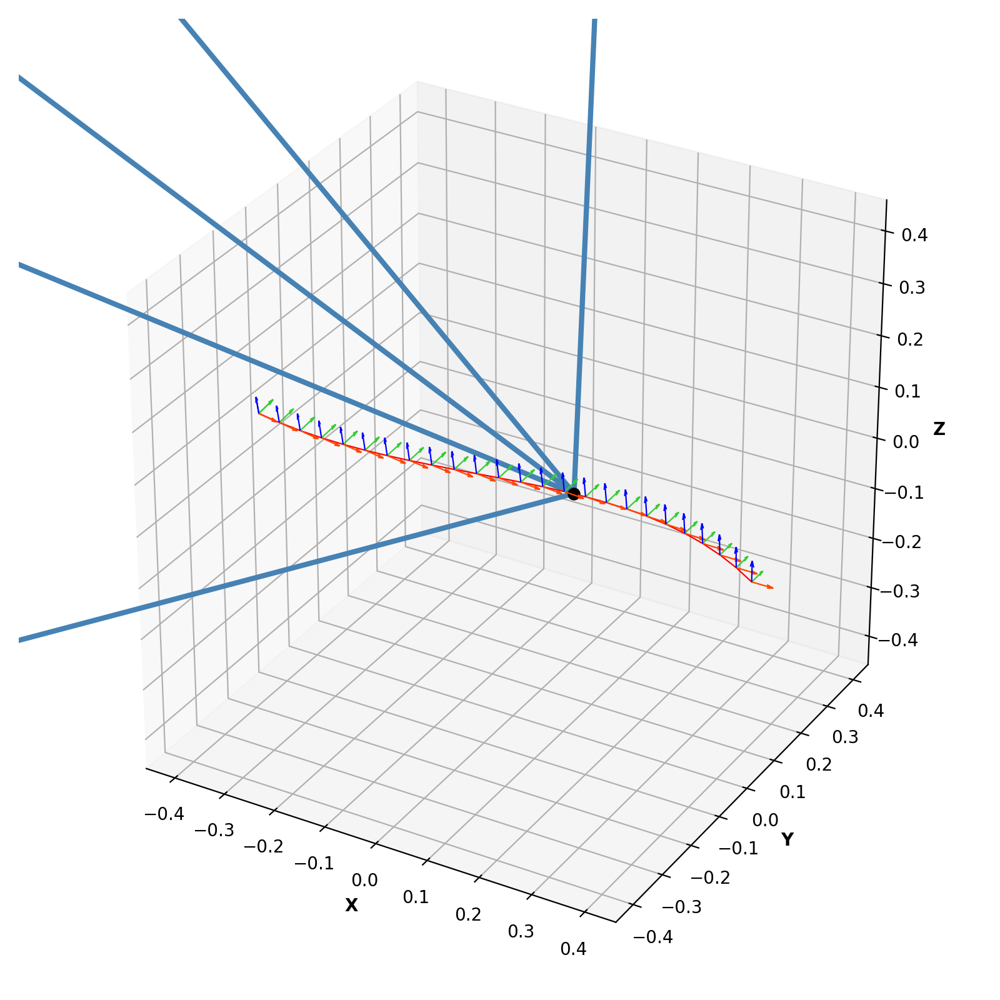

In [19]:
i=17
fig= plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection='3d')
plotMech5SS(DiverseMech[i],ax)
plotMotion(DiverseCplrPath[i],DiverseCplrOrient[i], ax, .4,'r' )

<IPython.core.display.Javascript object>


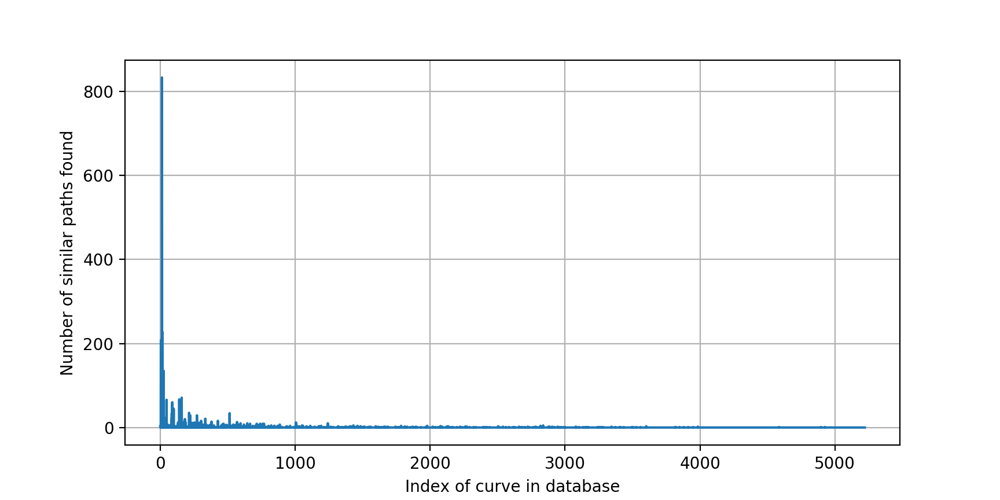

[13, 17, 5, 25, 22, 159, 141, 47, 89, 98, 100, 147, 146, 214, 514, 86, 85, 222, 272, 45, 83, 334, 19, 183, 33, 303, 427, 380, 569, 174, 132, 254, 1006, 189, 235, 182, 287, 278, 243, 294, 645, 1242, 336, 595, 769, 740, 758, 666, 150, 163, 715, 469, 513, 92, 462, 517, 55, 56, 1009, 464, 620, 541, 315, 220, 886, 581, 487, 129, 494, 135, 95, 548, 592, 74, 562, 726, 300, 304, 326, 366, 374, 397, 227, 554, 21, 823, 350, 2838, 483, 1051, 428, 1432, 659, 160, 176, 720, 452, 521, 460, 571]
[833.0, 227.0, 208.0, 135.0, 109.0, 71.0, 67.0, 66.0, 60.0, 45.0, 44.0, 43.0, 39.0, 35.0, 34.0, 34.0, 34.0, 29.0, 29.0, 24.0, 21.0, 21.0, 21.0, 20.0, 19.0, 16.0, 16.0, 14.0, 13.0, 13.0, 12.0, 12.0, 12.0, 12.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 10.0, 10.0, 10.0, 10.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 8.0, 8.0, 8.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0,

In [20]:
def plotPathVariety(closest_path_index, n):
    variety=np.zeros(n)
    for i in range(len(closest_path_index)):
        pth=closest_path_index[i]
        if (pth!=-1):
            variety[pth]+=1
    fig = plt.figure(figsize=.9*plt.figaspect(1/2))
    ax = fig.add_subplot(111)
    #ax.plot(range(len(variety)), np.flipud(np.sort(variety)));
    ax.plot(range(len(variety)), variety);
    plt.xlabel("Index of curve in database")
    plt.ylabel("Number of similar paths found")
    plt.grid(True)
    return variety

variety=plotPathVariety(closest_path_index, DiverseCplrPath.shape[0])
mostCommonIndex=np.flipud(np.argsort(variety)).tolist()[0:100]
CommonMultiplicity=np.flipud(np.sort(variety)).tolist()[0:100]
print(mostCommonIndex)
print(CommonMultiplicity)

21
0.1671826686657247 0


<IPython.core.display.Javascript object>


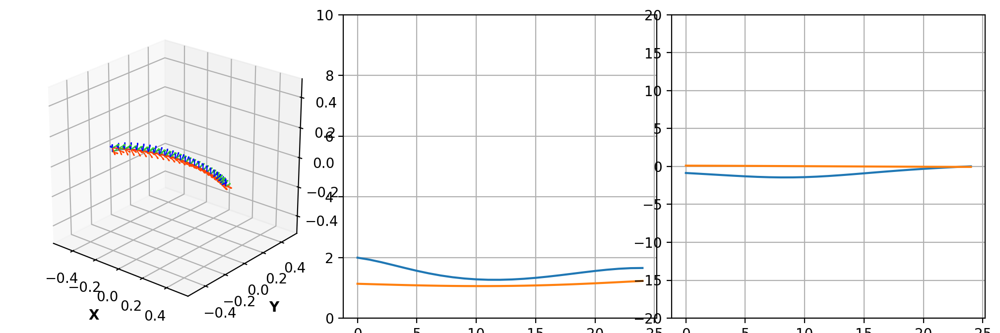

(25, 3)


In [24]:
# Example of similar curvature path
def plotCurvComparison(path1, path2, ori1,ori2):
    K1,T1=calcCurvatureTorsion(path1)
    K2,T2=calcCurvatureTorsion(path2)
    diff_ij,flip=compareMotions(K1, K2, T1, T2, ori1, ori2)
    print(diff_ij, flip)
    #plotFrenetDesc(path1,K1,T1)
    #plotFrenetDesc(path2,K2,T2)
    fig = plt.figure(figsize=.7*plt.figaspect(1/3))
    ax = fig.add_subplot(1, 3, 1, projection='3d')
    plotMotion(path1,ori1, ax, .5)
    if (flip==0):
        plotMotion(path2,ori2, ax, .5, 'red')
    else:
        plotMotion(path2,renormOrient(ori2), ax, .5, 'red')

    ax = fig.add_subplot(1, 3, 2)
    ax.plot(range(len(K1)), K1);
    if (flip==0):
        ax.plot(range(len(K2)), K2);
    else:
        ax.plot(range(len(K2)), np.flipud(K2));
    plt.grid(True)
    plt.ylim(0, 10);
    
    ax = fig.add_subplot(1, 3, 3)
    ax.plot(range(len(T1)), T1);
    if (flip==0):
        ax.plot(range(len(T2)), T2);
    else:
        ax.plot(range(len(T2)), np.flipud(T2));
    plt.grid(True)
    plt.ylim(-20, 20);
    plt.show()

closest_path_index=np.array(closest_path_index)
#plotCurvComparison(DiverseCplrK[13],DiverseCplrK[197])
index1=13
index2=np.argwhere(closest_path_index==index1)[0,0]
print(index2)
plotCurvComparison(DiverseCplrPath[index1],cplrpath[index2], DiverseCplrOrient[index1],cplrorient[index2])
print(DiverseCplrPath[index1].shape)

<IPython.core.display.Javascript object>


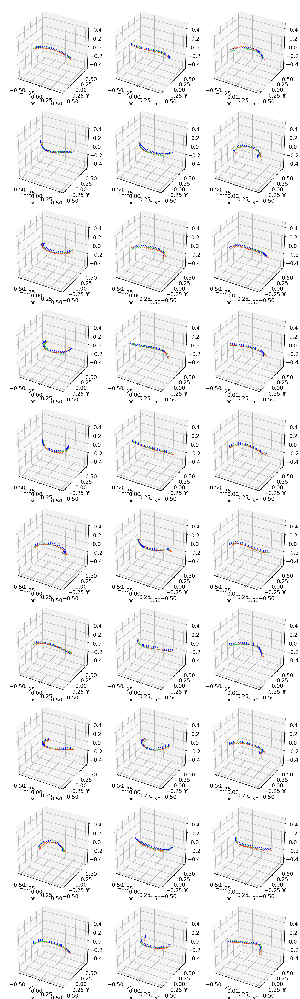

In [49]:
# Plot most common Coupler curve
CommonPaths=DiverseCplrPath[mostCommonIndex[0:30]]
CommonOrients=DiverseCplrOrient[mostCommonIndex[0:30]]
visualizeMotions(CommonPaths, CommonOrients)

<IPython.core.display.Javascript object>


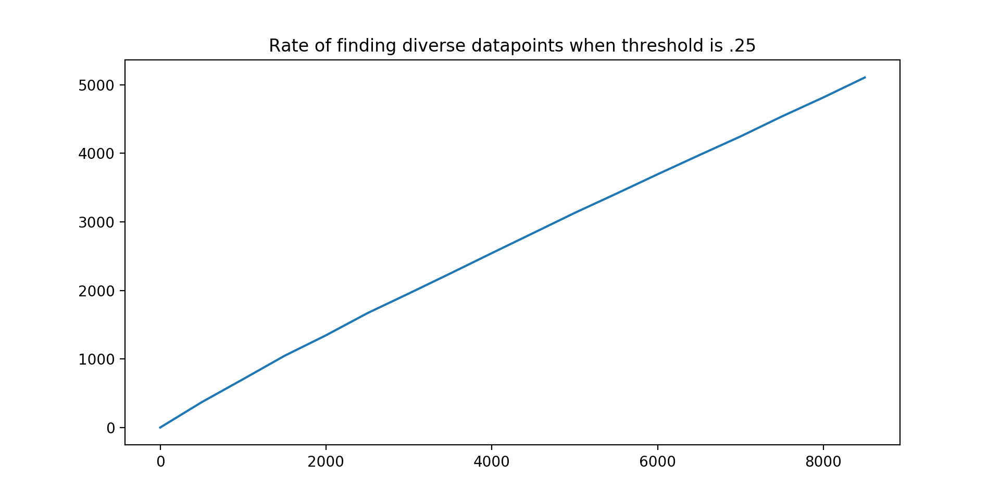

Text(0.5, 1.0, 'Rate of finding diverse datapoints when threshold is .25')

In [47]:
# Rate at which diverse data is added
# Ideally, to represent all of the curves, data should be added until the plot saturates
x=range(0,9000,500)

y_065=[0,369,705,1046,1345,1668,1955,2247,2543,2836,3130,3409,3693,3971,4245,4537,4814,5105]
#y_1=[0,282,529,771,1005,1222,1433,1654,1867,2097,2322,2552,2763,2973,3191,3365]
#y_5=[0,84,163,240,309,371,433,494,545,598,655,718,773,833,893,932]
#y1=[0,46,85,126,168,198,226,260,286,318,354,390,425,456,482,505]
#y2=[0,23,46,66,90,105,122,138,152,171,193,212,237,257,270,283]
fig = plt.figure(figsize=plt.figaspect(1/2))
ax = fig.add_subplot(111)
ax.plot(x,y_065)
#ax.plot(x,np.array(x)/1.7,'k:')
#ax.plot(x,y_1)
#ax.plot(x,y_5)
#ax.plot(x,y1)
#ax.plot(x,y2)
ax.set_title("Rate of finding diverse datapoints when threshold is .25")

<IPython.core.display.Javascript object>


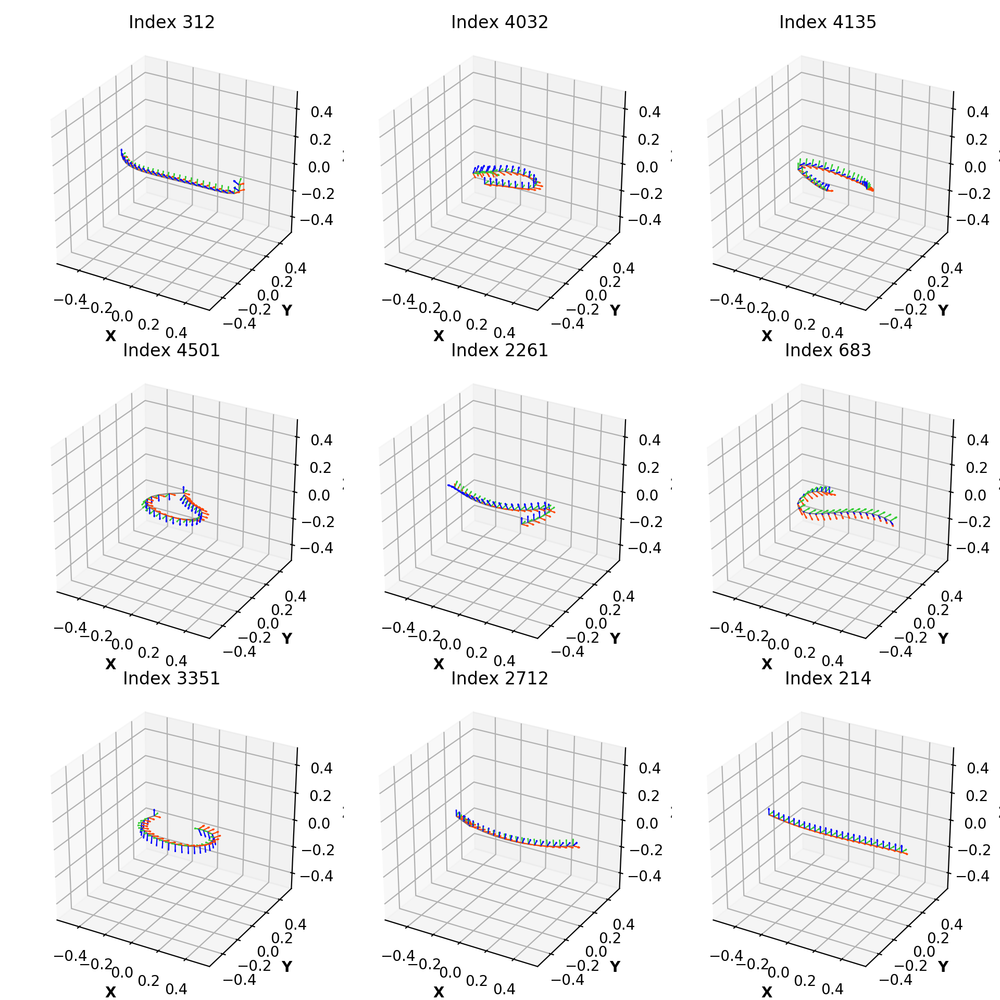

In [52]:
visualizeMotionsRand(DiverseCplrPath, DiverseCplrOrient, rows=3, cols=3)

In [26]:
np.savez_compressed('db2_5SS_balanced_s5222', pathData=DiverseCplrPath, orientData=DiverseCplrOrient, mechData=DiverseMech) 

# Data Augmentation

In [1]:
import numpy as np 
db = np.load('db2_5SS_balanced_s5222.npz')
DiverseCplrPath=db['pathData']
DiverseCplrOrient=db['orientData']
DiverseMech=db['mechData']
print(DiverseCplrPath.shape)
print(DiverseCplrOrient.shape)

(5222, 25, 3)
(5222, 25, 4)


## Add Mirrored mechanisms

During the normalization process, we ensure that invariance to translation, rotation, scaling and parametrization direction. One another desirable property our model should have is mirror invariance. Thus, adding mirrored paths enhances the robustness of model.

In [2]:
def mirrorMotionDB(Path,Orient,Plane,Mech):
    if Plane=='xy':
        index_Path=2
        index_Orient=[0,1]
    elif Plane=='yz':
        index_Path=0
        index_Orient=[1,2]
    elif Plane=='xz':
        index_Path=1
        index_Orient=[0,2]
    
    newPath=np.copy(Path)
    newOrient=np.copy(Orient)
    newMech=np.copy(Mech)
    for i in range(len(Path)):
        newPath[i][:,index_Path]=-1*newPath[i][:,index_Path]
        newOrient[i][:,index_Orient]=-1*newOrient[i][:,index_Orient]
        newMech[i][:,index_Path]=-1*newMech[i][:,index_Path]
    
    return newPath, newOrient, newMech

path_x,ori_x,mech_x=mirrorMotionDB(DiverseCplrPath.copy(),DiverseCplrOrient.copy(),'yz',DiverseMech)
path_y,ori_y,mech_y=mirrorMotionDB(DiverseCplrPath.copy(),DiverseCplrOrient.copy(),'xz',DiverseMech)
path_z,ori_z,mech_z=mirrorMotionDB(DiverseCplrPath.copy(),DiverseCplrOrient.copy(),'xy',DiverseMech)

path_mir=np.concatenate((DiverseCplrPath,path_x,path_y,path_z),axis=0)
ori_mir=np.concatenate((DiverseCplrOrient,ori_x,ori_y,ori_z),axis=0)
mech_mir=np.concatenate((DiverseMech,mech_x,mech_y,mech_z),axis=0)

print(DiverseCplrPath.shape)
print(path_mir.shape)

(5222, 25, 3)
(20888, 25, 3)


<IPython.core.display.Javascript object>


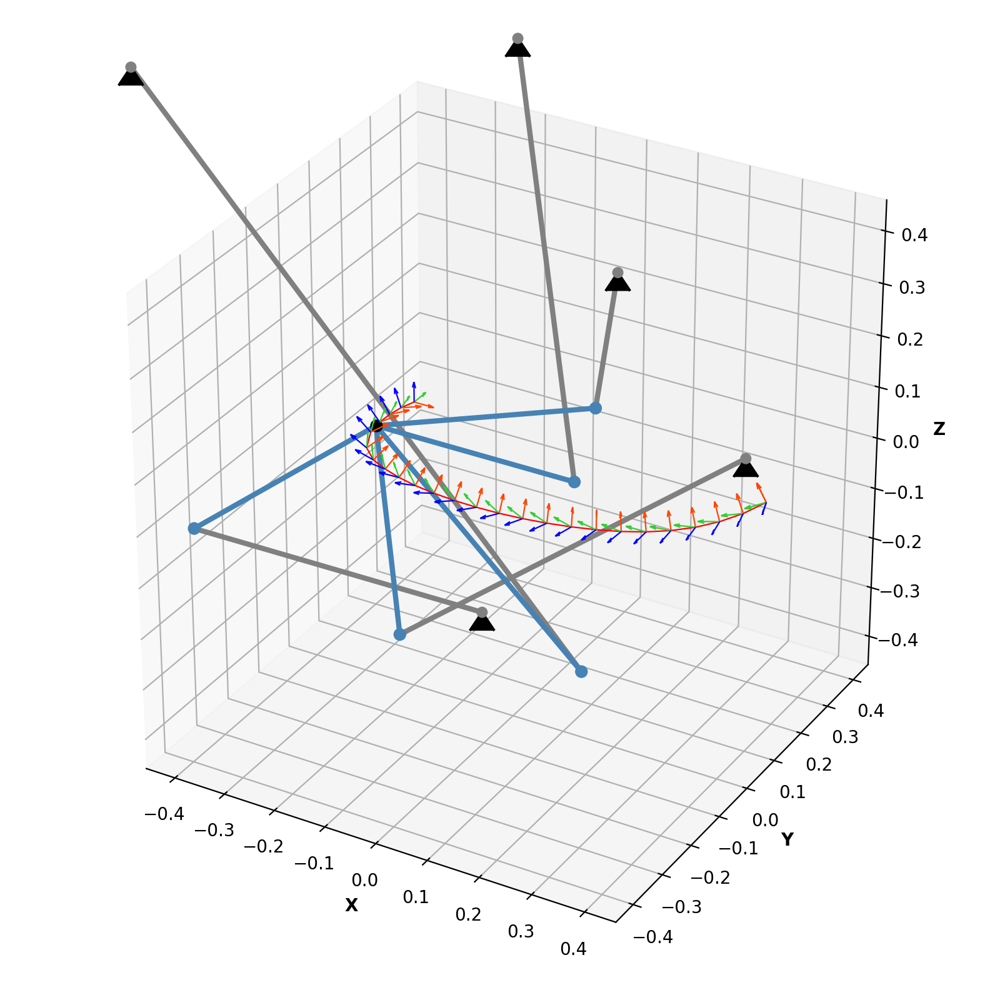

<IPython.core.display.Javascript object>


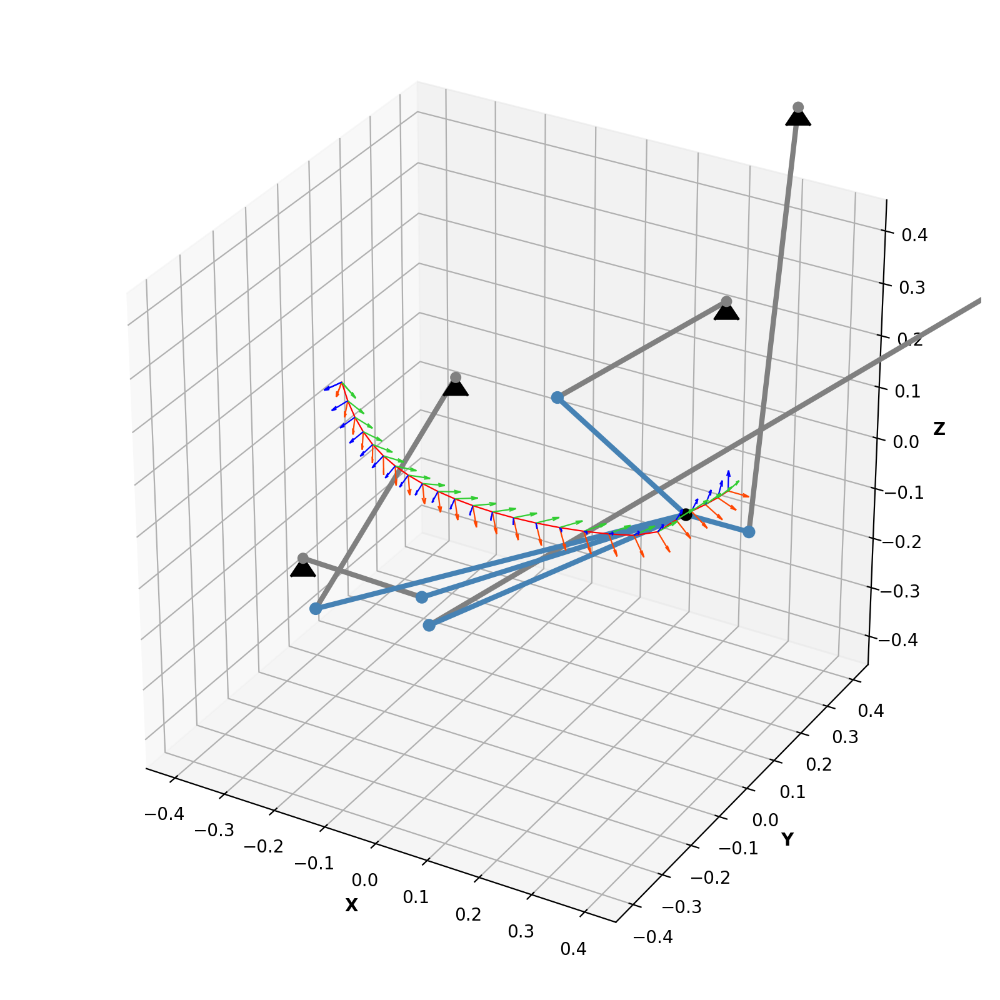

<IPython.core.display.Javascript object>


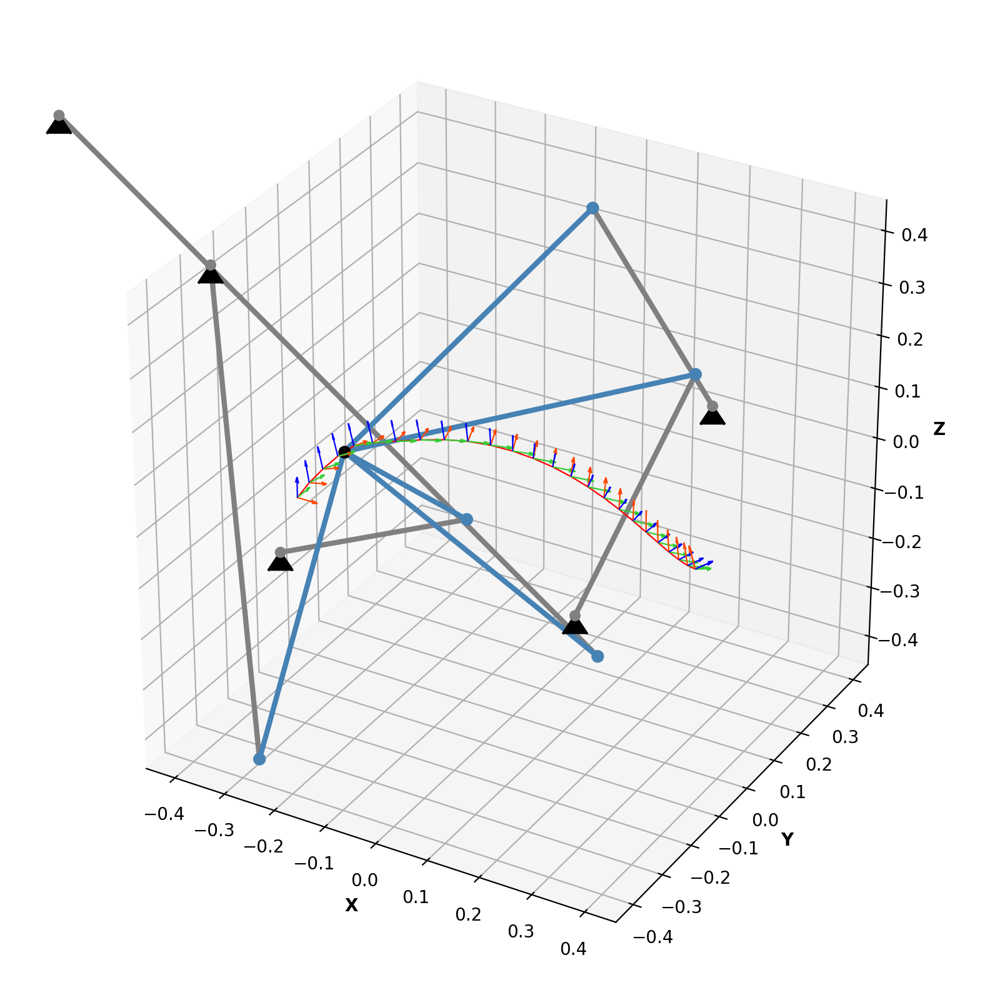

<IPython.core.display.Javascript object>


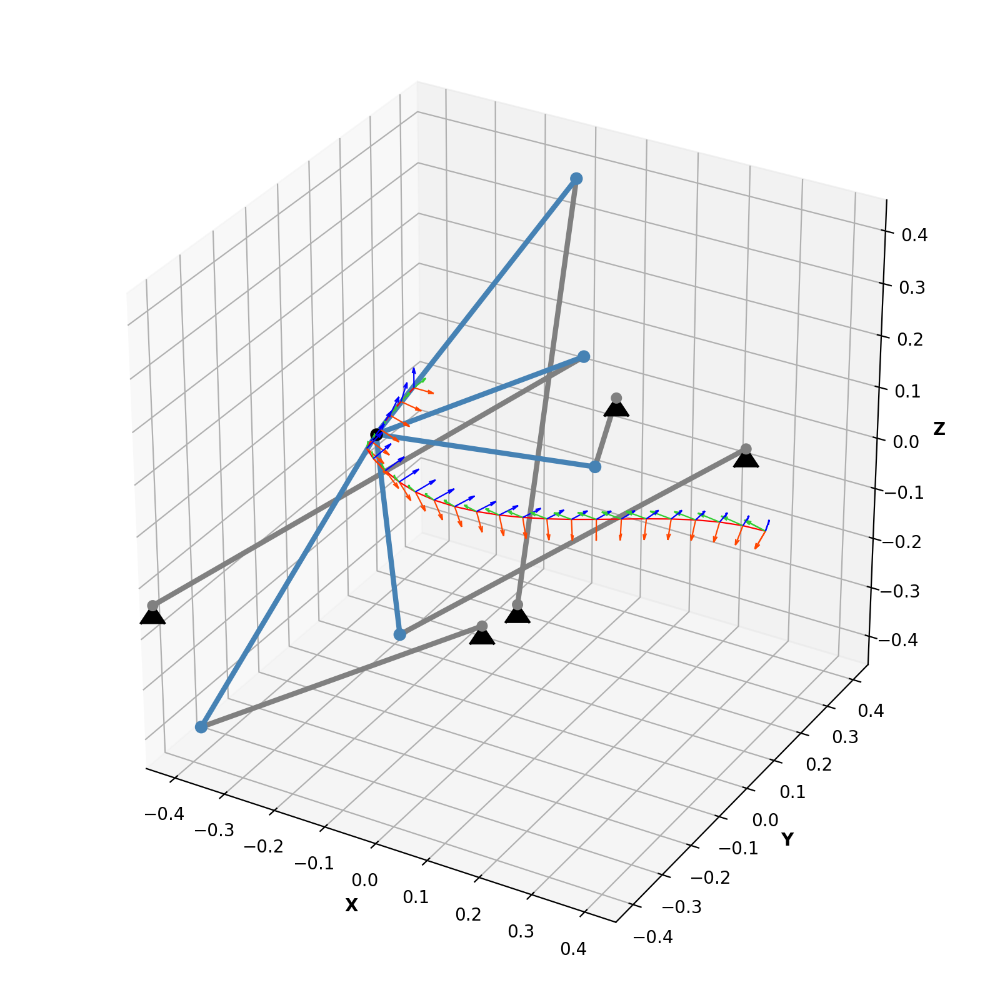

In [4]:
i=1400
fig= plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection='3d')
plotMech5SS(mech_mir[i],ax)
plotMotion(path_mir[i],ori_mir[i], ax, .4,'r' )

#Reflected along x axis
ix=i+5222
fig= plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection='3d')
plotMech5SS(mech_mir[ix],ax)
plotMotion(path_mir[ix],ori_mir[ix], ax, .4,'r' )

#Reflected along y axis
iy=i+2*5222
fig= plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection='3d')
plotMech5SS(mech_mir[iy],ax)
plotMotion(path_mir[iy],ori_mir[iy], ax, .4,'r' )

#Reflected along z axis
iz=i+3*5222
fig= plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection='3d')
plotMech5SS(mech_mir[iz],ax)
plotMotion(path_mir[iz],ori_mir[iz], ax, .4,'r' )

In [3]:
np.savez_compressed('db3_5SS_mirror_s20888', pathData=path_mir, orientData=ori_mir, mechData=mech_mir) 

## Add motions with partial orientation data

In [4]:
def createPartialMaskOrient(ori):
    randMask=np.random.randint(2,size=ori.shape[0])
    mask=np.vstack((randMask,randMask,randMask,randMask)).T
    randPartial=ori*mask
    return randPartial,randMask

def PartialMaskMotionDB(pathdb,oridb,n_partial,addPure=False):
    if (addPure):
        db_path=np.repeat(pathdb,n_partial+2,axis=0)
        db_ori=np.repeat(oridb,n_partial+2,axis=0)
    else:
        db_path=np.repeat(pathdb,n_partial,axis=0)
        db_ori=np.repeat(oridb,n_partial,axis=0)
    
    db_ori_part=[]
    db_ori_mask=[]
    for i in range(oridb.shape[0]):
        if (addPure):
            db_ori_part.append(oridb[i])
            db_ori_part.append(np.zeros(oridb[i].shape))
            db_ori_mask.append(np.ones(oridb[i].shape[0],dtype=int))
            db_ori_mask.append(np.zeros(oridb[i].shape[0],dtype=int))
            
        for j in range(n_partial):            
            ori_part_j,ori_mask_j=createPartialMaskOrient(oridb[i].copy())
            db_ori_part.append(ori_part_j)
            db_ori_mask.append(ori_mask_j)
    
    return np.array(db_path),np.array(db_ori), np.array(db_ori_part), np.array(db_ori_mask)

# Training DB
path_aug,ori_aug_full,ori_aug_part,ori_aug_mask=PartialMaskMotionDB(path_mir.copy(),ori_mir.copy(),18,addPure=True)
# Testing DB
path_aug_1,ori_aug_full_1,ori_aug_part_1,ori_aug_mask_1=PartialMaskMotionDB(path_mir,ori_mir,5)

In [5]:
# Complete motion DB
train_out=np.append(path_aug,ori_aug_full,axis=2)
test_out=np.append(path_aug_1,ori_aug_full_1,axis=2)
print(train_out.shape)
print(test_out.shape)

(417760, 25, 7)
(104440, 25, 7)


In [6]:
# Partial motion DB
print(path_aug.shape)
print(ori_aug_part.shape)
print(ori_aug_mask.shape)

print(path_aug_1.shape)
print(ori_aug_part_1.shape)
print(ori_aug_mask_1.shape)

(417760, 25, 3)
(417760, 25, 4)
(417760, 25)
(104440, 25, 3)
(104440, 25, 4)
(104440, 25)


In [7]:
np.savez_compressed('db4_5SS_full_train_s417760', out_motionData=train_out) 
np.savez_compressed('db4_5SS_full_test_s104440', out_motionData=test_out) 
#np.savez_compressed('db4_5SS_partial_train_s83552', pathData_part=path_aug, orientData_part=ori_aug_part, maskData=ori_aug_mask) 
#np.savez_compressed('db4_5SS_partial_test_s20888', pathData_part=path_aug_1, orientData_part=ori_aug_part_1, maskData=ori_aug_mask_1) 

## Add Noise for robust feature extraction

In [8]:
def createNoisyPath(path):
    interval=[-.03,.03]
    noise=(interval[1]-interval[0]) * np.random.random_sample(path.shape) + interval[0]
    noisy_path=path+noise
    return noisy_path

def createNoisyOri(ori, mask):
    interval=[-.02,.02]
    noise=(interval[1]-interval[0]) * np.random.random_sample(ori.shape) + interval[0]
    noise_mask=noise*np.vstack((mask,mask,mask,mask)).T
    noisy_ori=ori+noise_mask
    return noisy_ori

def NoisyMotionDB(db_path,db_ori,db_mask):
    db_noisy_path=[]
    db_noisy_ori=[]
    for i in range(db_ori.shape[0]):
        db_noisy_path.append(createNoisyPath(db_path[i]))
        db_noisy_ori.append(createNoisyOri(db_ori[i], db_mask[i]))
    return db_noisy_path, db_noisy_ori

In [9]:
path_noisy, ori_noisy=NoisyMotionDB(path_aug,ori_aug_part,ori_aug_mask)
path_noisy_1, ori_noisy_1=NoisyMotionDB(path_aug_1,ori_aug_part_1,ori_aug_mask_1)

train_in=np.concatenate((path_aug,ori_aug_full,np.expand_dims(ori_aug_mask, axis=2)),axis=2)
test_in=np.concatenate((path_aug_1,ori_aug_full_1,np.expand_dims(ori_aug_mask_1, axis=2)),axis=2)
print(train_in.shape)
print(test_in.shape)

(417760, 25, 8)
(104440, 25, 8)


In [10]:
np.savez_compressed('db5_5SS_part_noisy_train_s417760', in_motionData=train_in)
np.savez_compressed('db5_5SS_part_noisy_test_s104440', in_motionData=test_in)

# Visualize Final Database

In [11]:
db = np.load('db4_5SS_full_train_s417760.npz')
print(db['out_motionData'].shape)
db = np.load('db4_5SS_full_test_s104440.npz')
print(db['out_motionData'].shape)

db = np.load('db5_5SS_part_noisy_train_s417760.npz')
print(db['in_motionData'].shape)
db = np.load('db5_5SS_part_noisy_test_s104440.npz')
print(db['in_motionData'].shape)

(417760, 25, 7)
(104440, 25, 7)
(417760, 25, 8)
(104440, 25, 8)


<IPython.core.display.Javascript object>


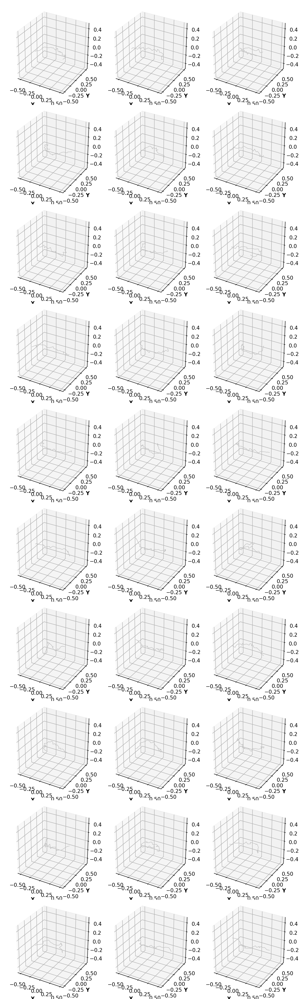

In [15]:
visualizePathsRand(np.array(path_noisy[0:20084]))